<div style="background-color:#a7e8d9; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h1 style="font-size:24px; font-family:calibri; color:#141140;"><b>🚀 YOLO: The Real-Time Object Detection Revolution</b></h1>
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        <strong>YOLO</strong>, short for "<strong>You Only Look Once</strong>", revolutionizes object detection in computer vision by offering a fast and streamlined approach. It uniquely simplifies the detection process, treating it as a single-step task that combines object localization and classification. This innovative method allows YOLO to process images and videos in real-time with high accuracy. The latest version, <strong>YOLOv8</strong>, further enhances this technology, adeptly tackling challenges in object detection and image segmentation. YOLO's real-time capabilities make it a standout choice for applications needing rapid and precise object identification.
    </p>
</div>


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h1 style="font-size:24px; font-family:calibri; color:#141140;"><b>🚦 Traffic Density Estimation Project Overview</b></h1>
    <p style="font-size:20px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        Leveraging YOLO's real-time detection capabilities, this project focuses on <strong>Traffic Density Estimation</strong>, a vital component in urban and traffic management. The goal is to count vehicles within a specific area in each frame to assess traffic density. This valuable data aids in identifying peak traffic periods, congested zones, and assists in urban planning. Through this project, we aim to develop a comprehensive toolset that provides detailed insights into traffic flow and patterns, enhancing traffic management and city planning strategies.
    </p>
</div>


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h1 style="font-size:24px; font-family:calibri; color:#141140;"><b>🎯 Project Objectives</b></h1>
    <ul style="font-size:20px; font-family:calibri; line-height: 1.5em;">
        <li><strong>YOLOv8 Model Selection and Initial Assessment:</strong> Starting with YOLOv8's pre-trained model selection, assessing its initial performance on COCO dataset for vehicle detection.</li>
        <li><strong>Specialized Vehicle Dataset Preparation:</strong> Curating and annotating a vehicle-specific dataset to refine the model's detection capabilities for diverse vehicle types.</li>
        <li><strong>Model Fine-Tuning for Enhanced Vehicle Detection:</strong> Employing transfer learning to fine-tune the YOLOv8 model, focusing on vehicle detection from aerial perspectives for improved precision and recall.</li>
        <li><strong>Comprehensive Model Performance Evaluation:</strong> Analyzing learning curves, evaluating confusion matrix, and assessing performance metrics to validate the model's accuracy and generalization capabilities.</li>
        <li><strong>Inference and Generalization on Test Data:</strong> Testing the model's generalization on validation images, an unseen test image, and a test video to demonstrate its practical application and effectiveness.</li>
        <li><strong>Real-Time Traffic Density Estimation:</strong> Implementing an algorithm to estimate traffic density by counting vehicles and analyzing traffic intensity in real-time on test video data.</li>
        <li><strong>Cross-Platform Model Deployment Preparation:</strong> Exporting the fine-tuned model in ONNX format for versatile use across different platforms and environments.</li>
    </ul>
</div>


# Import Modules

In [2]:
!pip install ultralytics -q

In [1]:
!pip install deep-sort-realtime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 51.7 MB/s eta 0:00:0000:0100:01


In [3]:
import os
import cv2
import numpy as np
import shutil
import subprocess
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
# =========================
# 2. LOAD MODELS
# =========================
yolo_model = YOLO('yolov8n.pt')
resnet_model = ResNet50(weights='imagenet')

102967424/102967424 [==============================] - 0s 0us/step


# Load Pretrained Model

In [5]:
# =========================
# 3. PATH SETUP
# =========================
dataset_path = '/kaggle/input/Vehicle_Detection_Image_Dataset'
video_path   = os.path.join(dataset_path, 'sample_video.mp4')
working_video= '/kaggle/working/sample_video.mp4'
shutil.copyfile(video_path, working_video)

'/kaggle/working/sample_video.mp4'

In [6]:
# =========================
# 4. TRAIN YOLO
# =========================
train_results = yolo_model.train(
    data=os.path.join(dataset_path, 'data.yaml'),
    epochs=5,
    imgsz=512,
    batch=4,
    device=0
)
best_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

Ultralytics 8.4.47 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/Vehicle_Detection_Image_Dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True,

2026-05-07 14:29:54,693	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2026-05-07 14:29:55,542	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

# Path to image file

In [7]:
# Label map
VEHICLE_LABEL_MAP = {
    'moving_van'            : 'car',
    'minivan'               : 'car',
    'van'                   : 'van',
    'pickup'                : 'truck',
    'garbage_truck'         : 'truck',
    'fire_engine'           : 'truck',
    'trailer_truck'         : 'truck',
    'semi'                  : 'truck',
    'ambulance'             : 'ambulance',
    'cab'                   : 'car',
    'taxicab'               : 'car',
    'limousine'             : 'car',
    'sports_car'            : 'car',
    'racer'                 : 'car',
    'convertible'           : 'car',
    'beach_wagon'           : 'car',
    'station_wagon'         : 'car',
    'jeep'                  : 'car',
    'Model_T'               : 'car',
    'motorscooter'          : 'motorcycle',
    'moped'                 : 'motorcycle',
    'bicycle-built-for-two' : 'bicycle',
    'mountain_bike'         : 'bicycle',
    'school_bus'            : 'bus',
    'trolleybus'            : 'bus',
    'minibus'               : 'bus',
}

# Initialize DeepSORT
tracker = DeepSort(
    max_age=30,         # frames to keep lost track alive
    n_init=3,           # frames before track is confirmed
    max_iou_distance=0.7
)

# Tracking state
unique_ids      = set()   # all vehicle IDs ever seen
vehicle_labels  = {}      # track_id → label
vehicle_counts  = {}      # label → count  e.g. {'car': 3, 'bus': 1}

cap = cv2.VideoCapture(working_video)
frame_width  = int(cap.get(3))
frame_height = int(cap.get(4))
fps          = int(cap.get(cv2.CAP_PROP_FPS)) or 20

out = cv2.VideoWriter(
    '/kaggle/working/final_output_raw.mp4',
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps,
    (frame_width, frame_height)
)

frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1

    if frame_count % 3 != 0:
        out.write(frame)
        continue

    # YOLO detection
    predictions = best_model.predict(frame, imgsz=640, conf=0.5, verbose=False)
    boxes       = predictions[0].boxes.xyxy.cpu().numpy()
    confs       = predictions[0].boxes.conf.cpu().numpy()

    # Build detections list for DeepSORT → ([x1,y1,w,h], conf, label)
    detections = []
    box_labels = []

    for box, conf in zip(boxes, confs):
        x1, y1, x2, y2 = map(int, box[:4])
        w = x2 - x1
        h = y2 - y1
        crop = frame[y1:y2, x1:x2]

        if crop.size == 0:
            continue

        # ResNet classification
        try:
            crop_rgb     = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
            crop_resized = cv2.resize(crop_rgb, (224, 224))
            img          = np.expand_dims(crop_resized, axis=0)
            img          = preprocess_input(img)
            preds        = resnet_model.predict(img, verbose=0)
            label        = decode_predictions(preds, top=1)[0][0][1]
            label        = VEHICLE_LABEL_MAP.get(label, label)
        except:
            label = 'vehicle'

        detections.append(([x1, y1, w, h], float(conf), label))
        box_labels.append(label)

    # Update DeepSORT tracker
    tracks = tracker.update_tracks(detections, frame=frame)

    # Draw tracks
    for track in tracks:
        if not track.is_confirmed():
            continue

        track_id = track.track_id
        ltrb     = track.to_ltrb()                        # [x1, y1, x2, y2]
        x1, y1, x2, y2 = map(int, ltrb)

        # Assign label to this track ID
        if track_id not in vehicle_labels:
            det_class = track.det_class if track.det_class else 'vehicle'
            vehicle_labels[track_id] = det_class

        label = vehicle_labels[track_id]

        # Count unique vehicles
        if track_id not in unique_ids:
            unique_ids.add(track_id)
            vehicle_counts[label] = vehicle_counts.get(label, 0) + 1

        # Draw bounding box
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Draw label + ID
        display_text = f"{label} ID:{track_id}"
        cv2.putText(frame, display_text, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Draw live count overlay on frame
    total = len(unique_ids)
    overlay_y = 30
    cv2.rectangle(frame, (10, 10), (280, 30 + 30 * (len(vehicle_counts) + 1)),
                  (0, 0, 0), -1)                          # black background
    cv2.putText(frame, f"Total Vehicles: {total}", (15, overlay_y),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    for v_label, count in vehicle_counts.items():
        overlay_y += 28
        cv2.putText(frame, f"  {v_label}: {count}", (15, overlay_y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

    out.write(frame)

cap.release()
out.release()

# Print final counts
print("=" * 35)
print(f"  Total unique vehicles: {len(unique_ids)}")
print("=" * 35)
for v_label, count in vehicle_counts.items():
    print(f"  {v_label:>15} : {count}")
print("=" * 35)
print("Pipeline done ✔")

35363/35363 [==============================] - 0s 0us/step
  Total unique vehicles: 41
              car : 13
  cassette_player : 4
      waffle_iron : 6
              ski : 5
            modem : 2
          cleaver : 1
            truck : 3
          toaster : 1
        stretcher : 1
          bobsled : 2
     bullet_train : 1
  red-breasted_merganser : 1
      whiskey_jug : 1
Pipeline done ✔


<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>🔍 Pre-trained Model Detection Analysis</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        In our sample image, the pre-trained model missed the detectable truck and car that were clearly visible. A model pre-trained on a dataset with a broad range of classes, like COCO's 80 different categories, may not perform as well on a specific subset of those categories due to the diversity of objects it has been trained to recognize. If we fine-tune this model on a specialized dataset that focuses solely on vehicles, it can learn to detect various types of vehicles more accurately. Fine-tuning on a vehicle-specific dataset allows the model to become more specialized, adjusting the weights to be more sensitive to features specific to vehicles. As a result, the model's mean Average Precision (mAP) for vehicle detection could improve because it's being optimized on a narrower, more relevant range of classes for our specific application. Fine-tuning also helps the model generalize better for vehicle detection tasks, potentially reducing false negatives (like missing a detectable truck) and improving overall detection performance.
    </p>
</div>


In [8]:
#Re encoding the data
result = subprocess.run([
    'ffmpeg', '-y',
    '-i', '/kaggle/working/final_output_raw.mp4',
    '-vcodec', 'libx264',
    '-crf', '23',
    '-preset', 'fast',
    '-pix_fmt', 'yuv420p',
    '/kaggle/working/final_output.mp4'
], capture_output=True, text=True)

print(result.stderr)
print("Re-encode done ✔")

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

<div style="background-color:#eae8fa; padding: 20px; border-radius: 10px; box-shadow: 0 2px 4px 0 rgba(0, 0, 0, 0.1);">
    <h2 style="font-size:22px; font-family:calibri; color:#141140;"><b>🗂️ Understanding the data.yaml File</b></h2>
    <p style="font-size:18px; font-family:calibri; line-height: 1.5em; text-indent: 20px;">
        As I previously mentioned, the 'data.yaml' file is a key part of setting up our model. It points out where to find the training and validation images and tells the model that we're focusing on just one class, named 'Vehicle'. This file is essential for making sure our Ultralytics YOLOv8 model learns from our specific dataset, as it guides the model to understand exactly what it needs to look for and where.
    </p>
</div>


In [9]:
from IPython.display import Video
Video("/kaggle/working/final_output.mp4", embed=True, width=600)

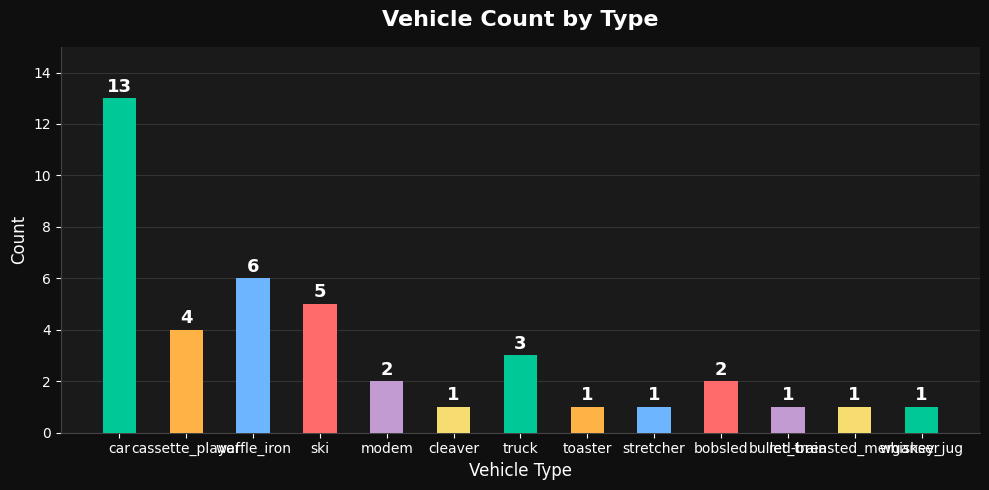

Graph saved ✔


In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# Data from tracking
labels = list(vehicle_counts.keys())
counts = list(vehicle_counts.values())
colors = ['#00C896', '#FFB347', '#6EB5FF', '#FF6B6B', '#C39BD3', '#F7DC6F']

fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor('#0f0f0f')
ax.set_facecolor('#1a1a1a')

bars = ax.bar(labels, counts, color=colors[:len(labels)], width=0.5, zorder=3)

# Value labels on top of bars
for bar, count in zip(bars, counts):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.1,
        str(count),
        ha='center', va='bottom',
        color='white', fontsize=13, fontweight='bold'
    )

ax.set_title('Vehicle Count by Type', color='white', fontsize=16, fontweight='bold', pad=15)
ax.set_xlabel('Vehicle Type',         color='white', fontsize=12)
ax.set_ylabel('Count',                color='white', fontsize=12)
ax.tick_params(colors='white')
ax.spines['bottom'].set_color('#444')
ax.spines['left'].set_color('#444')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.grid(True, color='#333', zorder=0)
ax.set_ylim(0, max(counts) + 2)

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_color('white')

plt.tight_layout()
plt.savefig('/kaggle/working/vehicle_count_graph.png', dpi=150, bbox_inches='tight',
            facecolor='#0f0f0f')
plt.show()
print("Graph saved ✔")

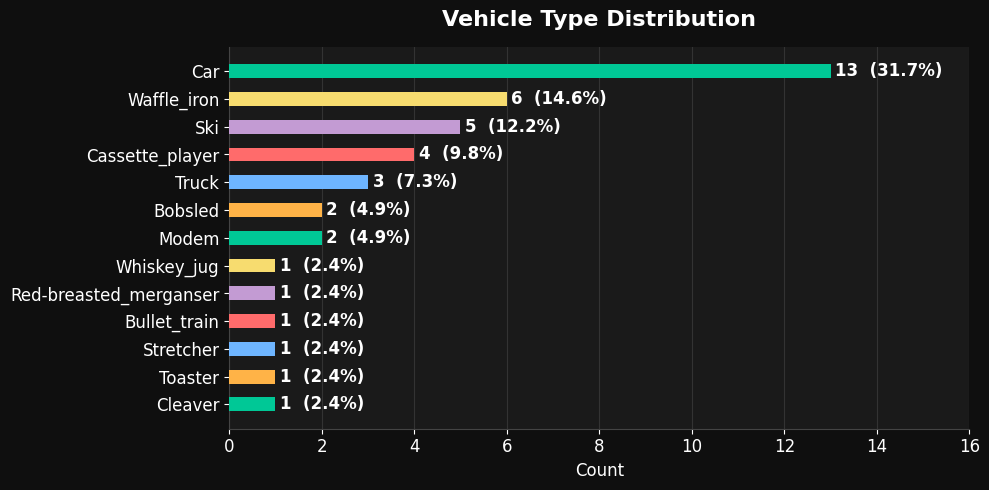

Distribution chart saved ✔


In [13]:
fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor('#0f0f0f')
ax.set_facecolor('#1a1a1a')

colors = ['#00C896', '#FFB347', '#6EB5FF', '#FF6B6B', '#C39BD3', '#F7DC6F']

# Sort by count
sorted_items  = sorted(vehicle_counts.items(), key=lambda x: x[1])
sorted_labels = [item[0].capitalize() for item in sorted_items]
sorted_counts = [item[1] for item in sorted_items]
total         = sum(sorted_counts)

# Horizontal bars
bars = ax.barh(sorted_labels, sorted_counts,
               color=colors[:len(sorted_labels)],
               height=0.5, zorder=3)

# Value + percentage labels at end of each bar
for bar, count in zip(bars, sorted_counts):
    percentage = (count / total) * 100
    ax.text(
        bar.get_width() + 0.1,
        bar.get_y() + bar.get_height() / 2,
        f"{count}  ({percentage:.1f}%)",
        va='center', ha='left',
        color='white', fontsize=12, fontweight='bold'
    )

ax.set_title('Vehicle Type Distribution', color='white',
             fontsize=16, fontweight='bold', pad=15)
ax.set_xlabel('Count',  color='white', fontsize=12)
ax.set_xlim(0, max(sorted_counts) + 3)

ax.tick_params(colors='white')
ax.spines['bottom'].set_color('#444')
ax.spines['left'].set_color('#444')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.xaxis.grid(True, color='#333', zorder=0)

for label in ax.get_xticklabels() + ax.get_yticklabels():
    label.set_color('white')
    label.set_fontsize(12)

plt.tight_layout()
plt.savefig('/kaggle/working/vehicle_distribution.png', dpi=150,
            bbox_inches='tight', facecolor='#0f0f0f')
plt.show()
print("Distribution chart saved ✔")

In [14]:
import pandas as pd

# Build summary dataframe
total_vehicles = len(unique_ids)

rows = []
for v_label, count in vehicle_counts.items():
    percentage = (count / total_vehicles) * 100
    rows.append({
        'Vehicle Type' : v_label.capitalize(),
        'Count'        : count,
        'Percentage'   : f"{percentage:.1f}%"
    })

# Sort by count descending
df = pd.DataFrame(rows).sort_values('Count', ascending=False).reset_index(drop=True)
df.index += 1  # start index from 1

# Add total row
total_row = pd.DataFrame([{
    'Vehicle Type' : 'TOTAL',
    'Count'        : total_vehicles,
    'Percentage'   : '100%'
}], index=[''])

df_display = pd.concat([df, total_row])

# Style the table
styled = df_display.style\
    .set_properties(**{
        'background-color' : '#1a1a1a',
        'color'            : 'white',
        'border'           : '1px solid #444',
        'padding'          : '10px 20px',
        'font-size'        : '14px',
        'text-align'       : 'center'
    })\
    .set_table_styles([
        {'selector': 'th', 'props': [
            ('background-color', '#00C896'),
            ('color', 'black'),
            ('font-size', '14px'),
            ('font-weight', 'bold'),
            ('padding', '10px 20px'),
            ('text-align', 'center')
        ]},
        {'selector': 'tr:last-child td', 'props': [
            ('background-color', '#333'),
            ('font-weight', 'bold'),
            ('color', '#00C896')
        ]},
        {'selector': 'caption', 'props': [
            ('color', 'white'),
            ('font-size', '16px'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]}
    ])\
    .set_caption("🚗 Final Vehicle Detection Summary")

display(styled)

# Also print plain text version
print("\n" + "=" * 40)
print(f"   FINAL VEHICLE DETECTION SUMMARY")
print("=" * 40)
for _, row in df.iterrows():
    print(f"  {row['Vehicle Type']:<15} {row['Count']:>4}   ({row['Percentage']})")
print("-" * 40)
print(f"  {'TOTAL':<15} {total_vehicles:>4}   (100%)")
print("=" * 40)

,Vehicle Type,Count,Percentage
1,Car,13,31.7%
2,Waffle_iron,6,14.6%
3,Ski,5,12.2%
4,Cassette_player,4,9.8%
5,Truck,3,7.3%
6,Modem,2,4.9%
7,Bobsled,2,4.9%
8,Toaster,1,2.4%
9,Cleaver,1,2.4%
10,Stretcher,1,2.4%



   FINAL VEHICLE DETECTION SUMMARY
  Car               13   (31.7%)
  Waffle_iron        6   (14.6%)
  Ski                5   (12.2%)
  Cassette_player    4   (9.8%)
  Truck              3   (7.3%)
  Modem              2   (4.9%)
  Bobsled            2   (4.9%)
  Toaster            1   (2.4%)
  Cleaver            1   (2.4%)
  Stretcher          1   (2.4%)
  Bullet_train       1   (2.4%)
  Red-breasted_merganser    1   (2.4%)
  Whiskey_jug        1   (2.4%)
----------------------------------------
  TOTAL             41   (100%)


In [15]:
import os
import shutil

save_dir = '/kaggle/working/saved_models'
os.makedirs(save_dir, exist_ok=True)

# Save YOLO best weights
shutil.copy(
    '/kaggle/working/runs/detect/train/weights/best.pt',
    f'{save_dir}/yolo_best.pt'
)

# Save ResNet50
resnet_model.save(f'{save_dir}/resnet50_vehicle.h5')

# Verify saved files
print("Saved files:")
print("-" * 40)
for f in os.listdir(save_dir):
    size = os.path.getsize(f'{save_dir}/{f}') / (1024 * 1024)
    print(f"  {f:<30} {size:.1f} MB")
print("-" * 40)
print("All models saved ✔")

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved files:
----------------------------------------
  yolo_best.pt                   5.9 MB
  resnet50_vehicle.h5            98.3 MB
----------------------------------------
All models saved ✔


In [17]:
import os
import shutil

# Create new folder with clear name
save_dir = '/kaggle/working/vehicle_detection_models_v2'
os.makedirs(save_dir, exist_ok=True)

# Save YOLO best weights
shutil.copy(
    '/kaggle/working/runs/detect/train/weights/best.pt',
    f'{save_dir}/yolo_best.pt'
)

# Save ResNet50
resnet_model.save(f'{save_dir}/resnet50_vehicle.h5')

# Verify
print("Saved files:")
print("-" * 40)
for f in os.listdir(save_dir):
    size = os.path.getsize(f'{save_dir}/{f}') / (1024 * 1024)
    print(f"  {f:<30} {size:.1f} MB")
print("-" * 40)
print("All models saved ✔")

Saved files:
----------------------------------------
  yolo_best.pt                   5.9 MB
  resnet50_vehicle.h5            98.3 MB
----------------------------------------
All models saved ✔


In [18]:
from IPython.display import FileLink, display

print("📥 Click below to download:")
print()
print("YOLO model:")
display(FileLink('/kaggle/working/vehicle_detection_models_v2/yolo_best.pt'))

print("ResNet50 model:")
display(FileLink('/kaggle/working/vehicle_detection_models_v2/resnet50_vehicle.h5'))

📥 Click below to download:

YOLO model:


/kaggle/working/vehicle_detection_models_v2/yolo_best.pt

ResNet50 model:


/kaggle/working/vehicle_detection_models_v2/resnet50_vehicle.h5